A simple example of SIFT based microscopy multimodel image registration.  
Same approach can be used for many other registration tasks.

In [1]:
from skimage import io
from skimage.color import rgb2gray

from skimage.feature import match_descriptors, plot_matches, SIFT
import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage import exposure

plt.rcParams['image.cmap'] = 'gray'

In [2]:
src_path = 'src_img.png'
des_path = 'des_img.png'

We need single channel images, thus rgb2gray when needed.  
For this example, we assume that if we have three channels it's an RGB (and not channels, time, and so on).

In [3]:
def read_image(im_path):
    im = io.imread(im_path)
    if im.ndim == 3:
        im = rgb2gray(im)
    return im
        

In [4]:
def show_images(src, des):
    
    # Create subplots
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    axs[0].imshow(src)
    axs[0].set_title('Source Image')
    axs[0].set_aspect('equal')
    
    axs[1].imshow(des, cmap='gray')
    axs[1].set_title('Destination Image (Grayscale)')
    axs[1].set_aspect('equal')

    plt.tight_layout()
    plt.show()

In [5]:
src = read_image(src_path)
des = read_image(des_path)

src.shape, des.shape

((402, 553), (543, 600))

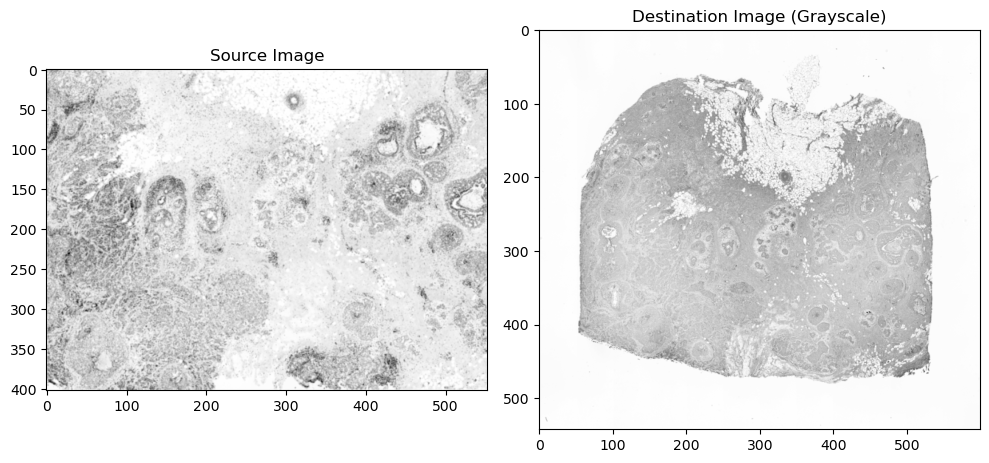

In [6]:
show_images(src, des)

### SIFT Based Keypoint Matching

In [7]:
def get_keypoints_and_descriptors(detector, img):
    detector.detect_and_extract(img)
    kps = detector.keypoints
    desc = detector.descriptors
    
    return kps, desc

In [8]:
def get_matches(src_desc, des_desc, max_ratio):
    matches = match_descriptors(src_desc, des_desc, max_ratio=max_ratio, cross_check=True)
    
    if matches.shape[0]<4:
        print('Not enough matched keypoints were detected')
        return None
    else:
        return matches

`skimage.feature.match_descriptors` is a function that matches keypoint descriptors between two images using nearest-neighbor search.  
`cross-check` ensures mutual nearest neighbor matching, improving accuracy.  
The `max_ratio` parameter in `match_descriptors` controls the ratio test, which helps filter out ambiguous matches. It compares the distance between the best match and the second-best match for each descriptor, rejecting those that are too similar.


In [9]:
# Define keypoint descriptor method:
detector = SIFT()
# Define max ratio of compared descriptor matching:
max_ratio=0.75

This is SIFT from `scikit-image`. Alternatively `cv2.SIFT.create` allows the user to 

`cv2.SIFT.create(nfeatures, nOctaveLayers, contrastThreshold, edgeThreshold, sigma, descriptorType, enable_precise_upscale)`

##### Parameter Descriptions:
- **`nfeatures`**: The maximum number of keypoints to retain.
- **`nOctaveLayers`**: The number of subdivision layers per octave, influencing the detection at different scales.
- **`contrastThreshold`**: A threshold to filter out weak features based on their contrast.
- **`edgeThreshold`**: Filters out keypoints that are too close to edges to improve stability.
- **`sigma`**: The sigma of Gaussian applied to the input image at the first octave.
- **`descriptorType`**: Specifies the type of descriptor, typically left as the default (e.g., `CV_32F`).
- **`enable_precise_upscale`**: Allows for more precise localization of keypoints with potential upscaling.

In [10]:
%%time
src_kps, src_desc = get_keypoints_and_descriptors(detector, src)
des_kps, des_desc = get_keypoints_and_descriptors(detector, des)

CPU times: user 1.25 s, sys: 77.2 ms, total: 1.33 s
Wall time: 1.33 s


SIFT descriptors are feature vectors that describe local image regions around the keypoints in a (partially) scale and intensity invarient way, making them pretty robust to changes in scale, rotation, and illumination.

In [11]:
matches = get_matches(src_desc, des_desc, max_ratio)

src_matched = src_kps[matches[:,0]]
des_matched = des_kps[matches[:,1]]

In [12]:
# Delete keypoints duplicates
src_matched, idx = np.unique(src_matched, axis=0, return_index=True)
des_matched = des_matched[idx,:]
matches = matches[idx,:]

n_kps = matches.shape[0]
print(f'Number of matches: {n_kps}')

Number of matches: 12


### View matches

In [13]:
def plot_keypoint_matches(src, des, kps_src, kps_des, matches):

    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Call a custom plot_matches function (replace with your specific function if needed)
    plot_matches(ax, src, des, kps_src, kps_des, matches, only_matches=True)
    
    # Customize the plot
    ax.axis('off')
    ax.set_title('Keypoint Matched')

    # Show the plot
    plt.show()

In [14]:
def plot_keypoints_with_idxs(src, des, m_src, m_des):

    n_kps = len(m_src)

    annotation_size = 25
    marker_size = 300
    colors = np.random.rand(n_kps, 3)  # Random RGB colors for each keypoint pair
    
    # Create a figure with two subplots
    fig, ax = plt.subplots(1, 2, figsize=(20, 10))

    # Plot keypoints on the source image
    ax[0].imshow(src)
    for i in range(n_kps):
        ax[0].scatter(m_src[i, 1], m_src[i, 0], color=colors[i], label=f'Keypoint {i}', s=marker_size)
        ax[0].annotate(i, (m_src[i, 1], m_src[i, 0]), color='black', size=annotation_size)  # Annotate keypoints with their index
    ax[0].axis('off')
    ax[0].set_title('Source Image Keypoints', fontsize=20)

    # Plot keypoints on the destination image
    ax[1].imshow(des)
    for i in range(n_kps):
        ax[1].scatter(m_des[i, 1], m_des[i, 0], color=colors[i], label=f'Keypoint {i}', s=marker_size)
        ax[1].annotate(i, (m_des[i, 1], m_des[i, 0]), color='black', size=annotation_size)  # Annotate keypoints with their index
    ax[1].axis('off')
    ax[1].set_title('Destination Image Matched Keypoints', fontsize=20)
    

    # Show the plot
    plt.tight_layout()
    plt.show()

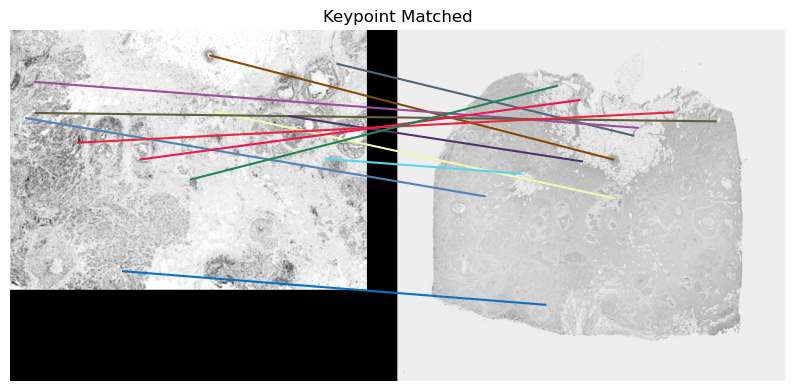

In [15]:
plot_keypoint_matches(src, des, src_kps, des_kps, matches)

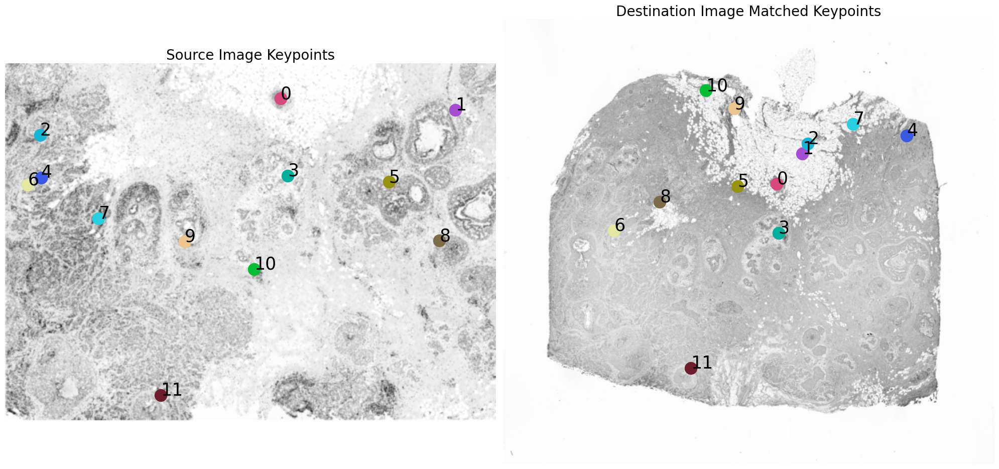

In [16]:
plot_keypoints_with_idxs(src, des, src_matched, des_matched)

In [17]:
def flip_points(kps1, kps2):
    kps1_f = np.flip(kps1, axis=1).astype(np.float32)
    kps2_f = np.flip(kps2, axis=1).astype(np.float32)
    return kps1_f, kps2_f

In [18]:
src_matched_f, des_matched_f = flip_points(src_matched, des_matched)

### Find Registration Matrix
https://vivekseth.com/computer-vision-matrix-differences/

In [19]:
warp_mat, mask = cv2.findHomography(src_matched_f, des_matched_f, cv2.RANSAC, 3)

RANSAC in `cv2.findHomography` is used to robustly estimate a homography matrix by iteratively selecting random subsets of matching keypoints, computing the homography, and identifying inliers based on a reprojection error threshold. It helps discard outliers, ensuring that only reliable keypoint matches contribute to the final transformation.

The example here uses the homography (perspective transformation) to warp the source image, but other transformations can be used.  
E.g. Affine followed by Thin Plate Spline (using the points that were found to be good matches by RANSAC)  
https://answers.opencv.org/question/182991/how-to-use-createthinplatesplineshapetransformer-with-python/

In [20]:
# Apply transformation
warp_src = cv2.warpPerspective(mber of matches: 12, warp_mat, (src.shape[1], src.shape[0]))#, flags=cv2.INTER_LINEAR)

### View results

In [21]:
inliers = mask.ravel() == 1
src_inliers = src_matched[inliers]
des_inliers = des_matched[inliers]

src_inliers_f, des_inliers_f = flip_points(src_inliers, des_inliers)

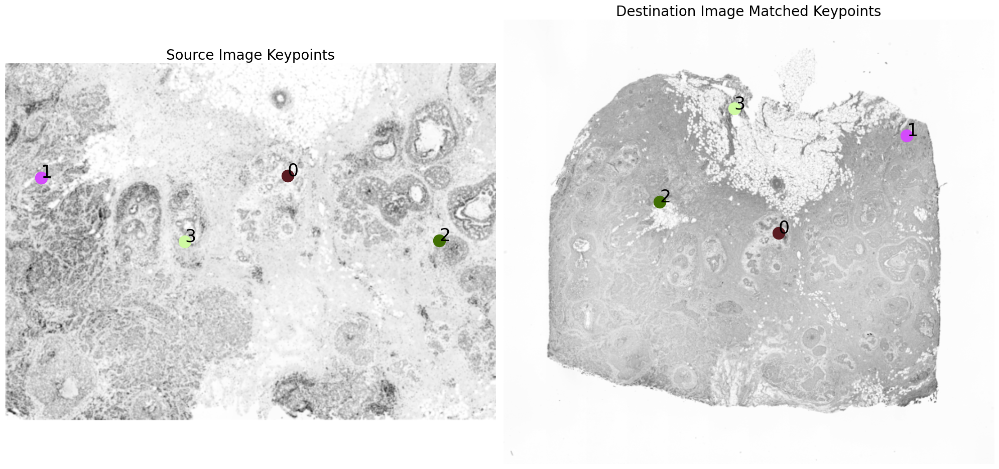

In [22]:
plot_keypoints_with_idxs(src, des, src_inliers, des_inliers)

In [23]:
def check_euc_distance(kps1, kps2, warp_mat, mask):
    
    # Check the number of inliers
    n_kps = len(kps1)

    # Homogeneous coordinates for keypoints in source
    kps1_1 = np.append(kps1, np.ones((n_kps, 1)), axis=1)

    # Apply the warp matrix (homography) to the source keypoints
    w_kps1 = np.dot(warp_mat, kps1_1.T).T
    w_kps1 = (w_kps1.T / w_kps1[:, 2]).T[:, :2]

    # Calculate Euclidean distances between the transformed source and destination keypoints
    dist = np.linalg.norm(w_kps1 - kps2, axis=1)

    # Compute the mean distance
    mean_distance = np.mean(dist)

    # Print the result
    print(f'Mean distance between keypoint in destination to keypoint in registered space: {mean_distance} for {n_kps} keypoints.')


In [24]:
check_euc_distance(src_matched_f, des_matched_f, warp_mat, mask)
check_euc_distance(src_inliers_f, des_inliers_f, warp_mat, mask)

Mean distance between keypoint in destination to keypoint in registered space: 156.559823946964 for 12 keypoints.
Mean distance between keypoint in destination to keypoint in registered space: 7.216879005150915e-14 for 4 keypoints.


In [25]:
def plot_registration_results(des, warp_src):

    title_size = 20

    fig, ax = plt.subplots(1, 3, figsize=(20, 10))

    ax[0].imshow(des)
    ax[0].set_title('Destination Image', fontsize=title_size)

    ax[1].imshow(warp_src)
    ax[1].set_title('Warped Source Image', fontsize=title_size)

    ax[2].imshow(des)
    ax[2].imshow(warp_src, alpha=0.2, cmap='jet')
    ax[2].set_title('Overlay (Source on Destination)', fontsize=title_size)

    for a in ax:
        a.axis('off')

    plt.tight_layout()
    plt.show()


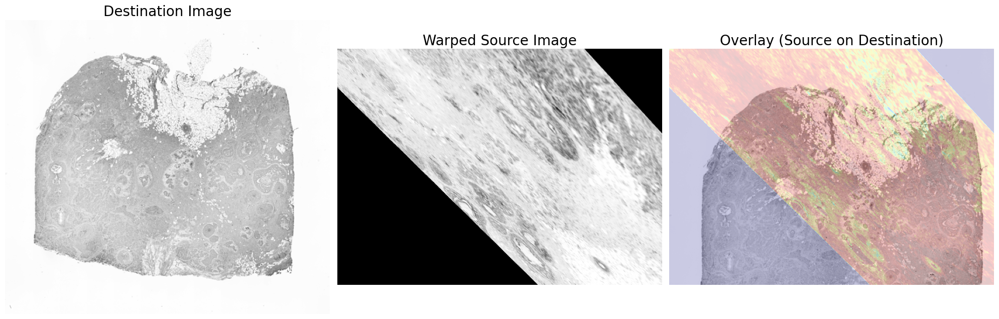

In [26]:
plot_registration_results(des, warp_src)

## Retry on normalized image - Rescale Intensity:

Normalizing image intensity ensures that keypoint detectors like SIFT operate effectively, as they rely on consistent intensity gradients to identify features. In images with poor contrast or varying illumination, normalization enhances the visibility of keypoints by equalizing brightness and contrast, improving feature detection and matching.

No matter what filters were applied on the source image in order to obtain best registration results, once the transformation matrix was calculated, it can be applied on the original source image, as well as any image from the source space (e.g. image channels).  
In case the source image was downscaled or upscaled, the transformation matrix calculated can still be used but needs to be adjusted acording to a formula:  
https://stackoverflow.com/questions/21019338/how-to-change-the-homography-with-the-scale-of-the-image

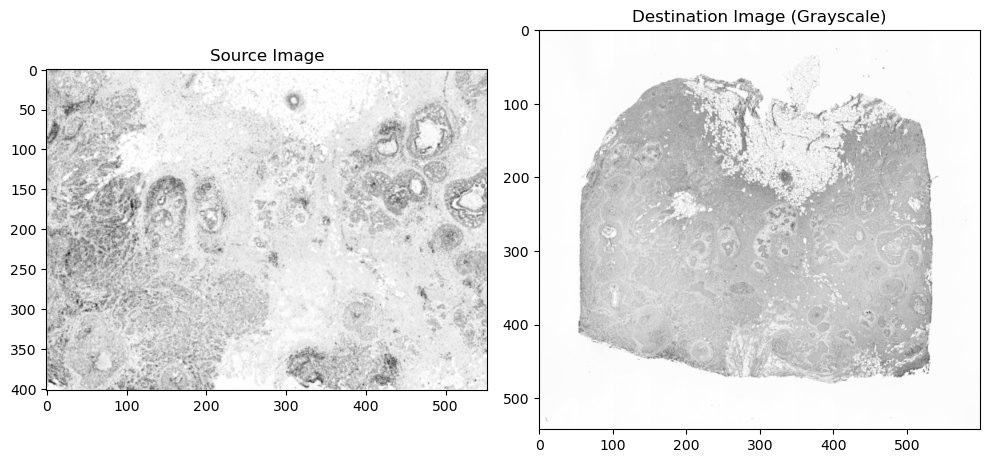

Number of matches: 17


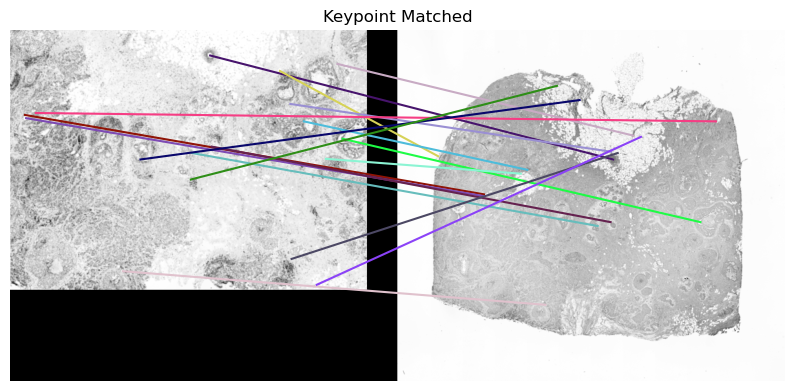

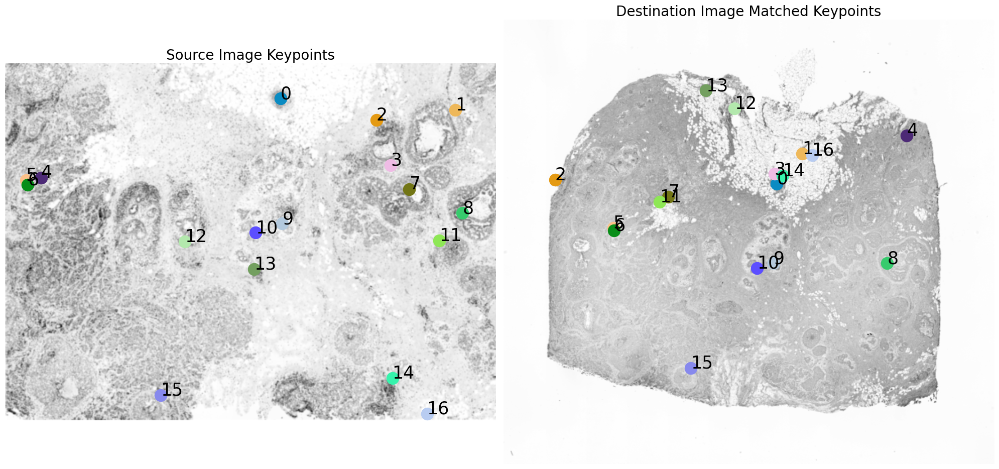

In [27]:
src = read_image(src_path)
des = read_image(des_path)

src = exposure.rescale_intensity(src, in_range='image', out_range=(0, 1))
des = exposure.rescale_intensity(des, in_range='image', out_range=(0, 1))

show_images(src, des)

# Define keypoint descriptor method:
detector = SIFT()
# Define max ratio of compared descriptor matching:
max_ratio=0.75

src_kps, src_desc = get_keypoints_and_descriptors(detector, src)
des_kps, des_desc = get_keypoints_and_descriptors(detector, des)

matches = get_matches(src_desc, des_desc, max_ratio)
src_matched = src_kps[matches[:,0]]
des_matched = des_kps[matches[:,1]]

# Delete keypoints duplicates
src_matched, idx = np.unique(src_matched, axis=0, return_index=True)
des_matched = des_matched[idx,:]
matches = matches[idx,:]

src_matched_f, des_matched_f = flip_points(src_matched, des_matched)

n_kps = matches.shape[0]
print(f'Number of matches: {n_kps}')

plot_keypoint_matches(src, des, src_kps, des_kps, matches)
plot_keypoints_with_idxs(src, des, src_matched, des_matched)

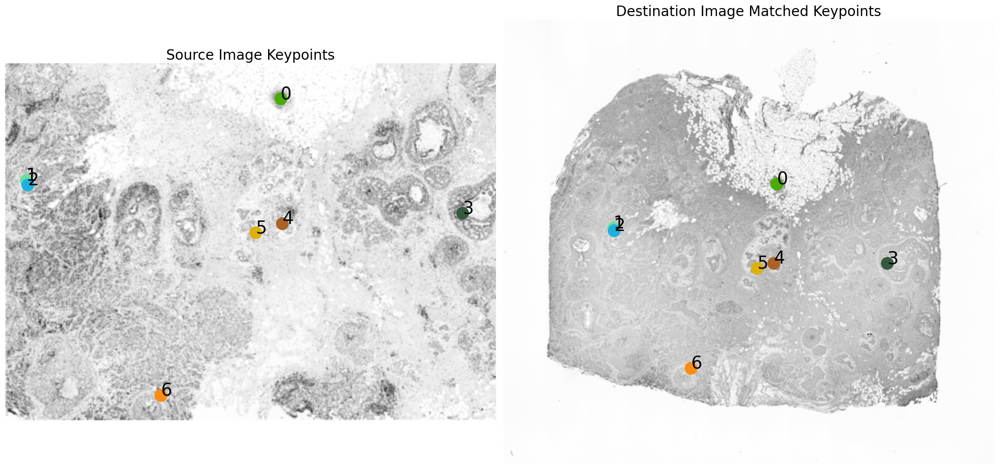

Mean distance between keypoint in destination to keypoint in registered space: 143.19885786719848 for 17 keypoints.
Mean distance between keypoint in destination to keypoint in registered space: 0.4557702535254232 for 7 keypoints.


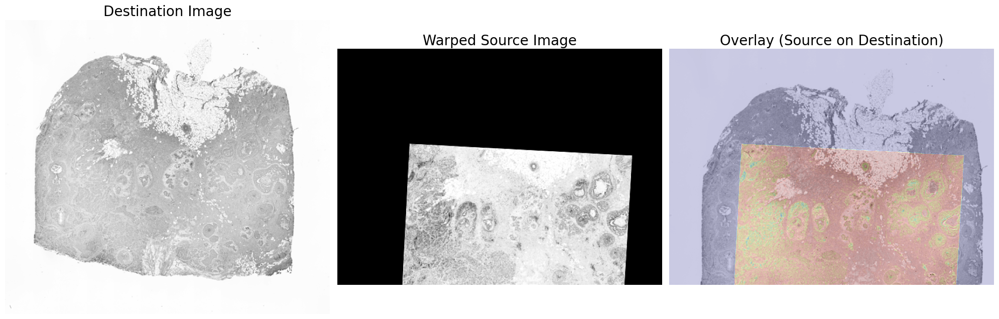

In [28]:
warp_mat, mask = cv2.findHomography(src_matched_f, des_matched_f, cv2.RANSAC, 3)
warp_src = cv2.warpPerspective(src, warp_mat, (src.shape[1], src.shape[0]))#, flags=cv2.INTER_LINEAR)

inliers = mask.ravel() == 1
src_inliers = src_matched[inliers]
des_inliers = des_matched[inliers]

src_inliers_f, des_inliers_f = flip_points(src_inliers, des_inliers)

plot_keypoints_with_idxs(src, des, src_inliers, des_inliers)

check_euc_distance(src_matched_f, des_matched_f, warp_mat, mask)
check_euc_distance(src_inliers_f, des_inliers_f, warp_mat, mask)

plot_registration_results(des, warp_src)

## Retry on normalized image - Equalize Histogram:

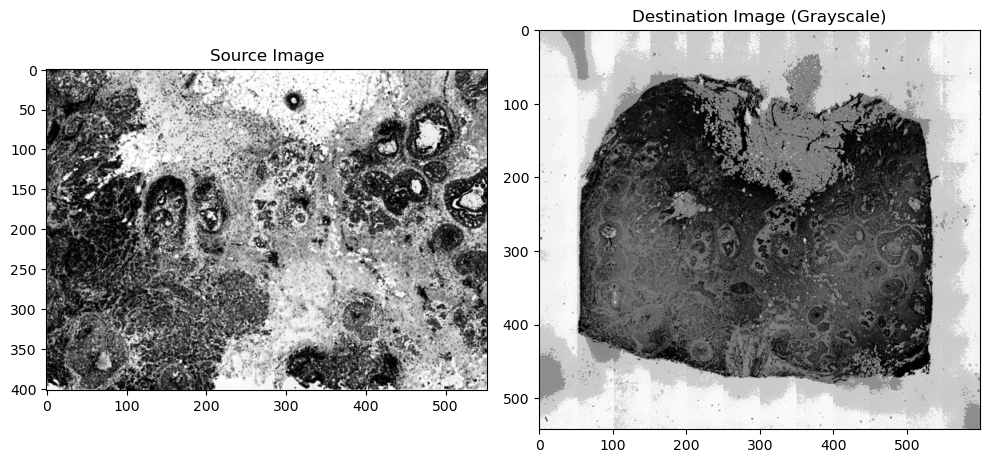

Number of matches: 24


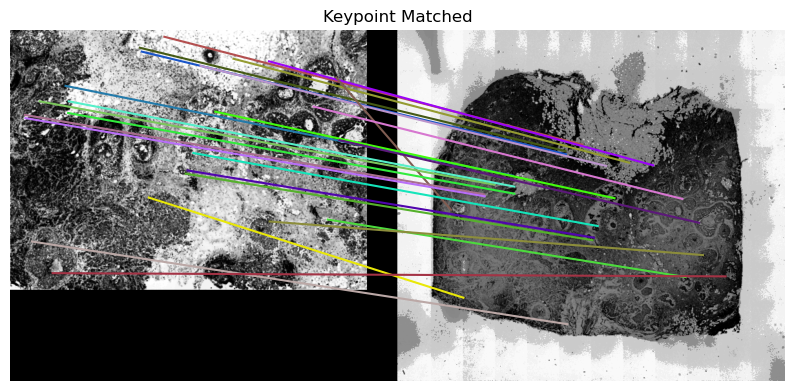

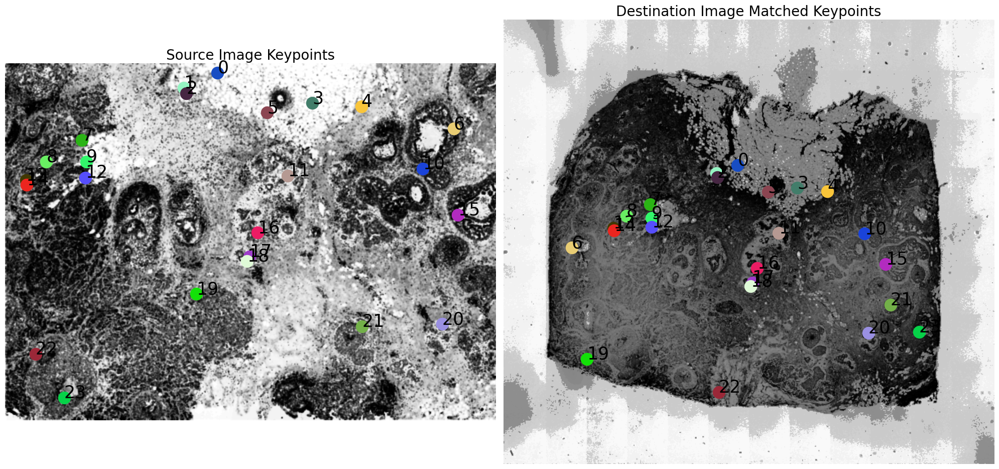

In [29]:
src = read_image(src_path)
des = read_image(des_path)

src = exposure.equalize_hist(src)
des = exposure.equalize_hist(des)

show_images(src, des)

# Define keypoint descriptor method:
detector = SIFT()
# Define max ratio of compared descriptor matching:
max_ratio=0.75

src_kps, src_desc = get_keypoints_and_descriptors(detector, src)
des_kps, des_desc = get_keypoints_and_descriptors(detector, des)

matches = get_matches(src_desc, des_desc, max_ratio)
src_matched = src_kps[matches[:,0]]
des_matched = des_kps[matches[:,1]]

# Delete keypoints duplicates
src_matched, idx = np.unique(src_matched, axis=0, return_index=True)
des_matched = des_matched[idx,:]
matches = matches[idx,:]

src_matched_f, des_matched_f = flip_points(src_matched, des_matched)

n_kps = matches.shape[0]
print(f'Number of matches: {n_kps}')

plot_keypoint_matches(src, des, src_kps, des_kps, matches)
plot_keypoints_with_idxs(src, des, src_matched, des_matched)

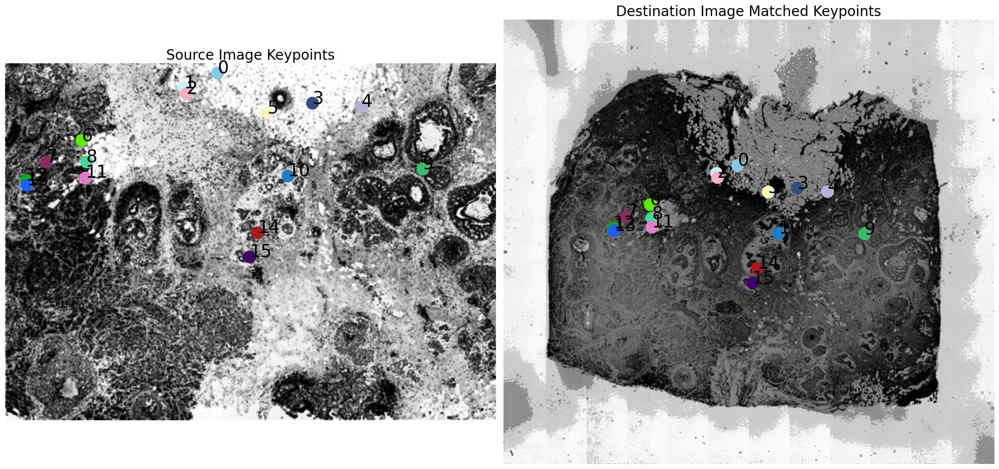

Mean distance between keypoint in destination to keypoint in registered space: 48.37852095581519 for 24 keypoints.
Mean distance between keypoint in destination to keypoint in registered space: 0.5890971468032087 for 16 keypoints.


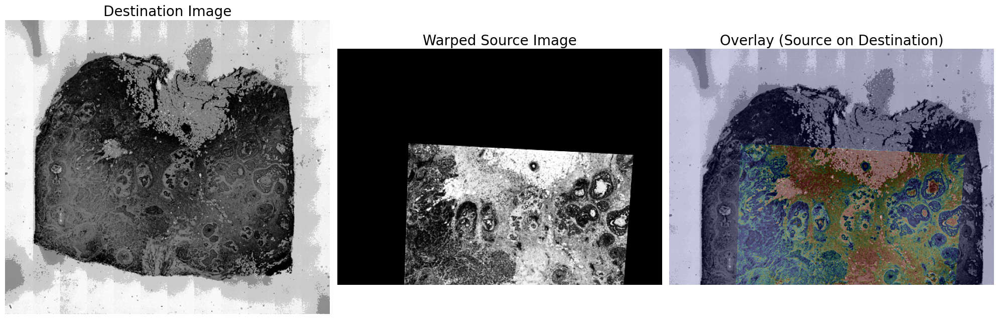

In [30]:
warp_mat, mask = cv2.findHomography(src_matched_f, des_matched_f, cv2.RANSAC, 3)
warp_src = cv2.warpPerspective(src, warp_mat, (src.shape[1], src.shape[0]))#, flags=cv2.INTER_LINEAR)

inliers = mask.ravel() == 1
src_inliers = src_matched[inliers]
des_inliers = des_matched[inliers]

src_inliers_f, des_inliers_f = flip_points(src_inliers, des_inliers)

plot_keypoints_with_idxs(src, des, src_inliers, des_inliers)

check_euc_distance(src_matched_f, des_matched_f, warp_mat, mask)
check_euc_distance(src_inliers_f, des_inliers_f, warp_mat, mask)

plot_registration_results(des, warp_src)